Using device: cuda


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_01.png


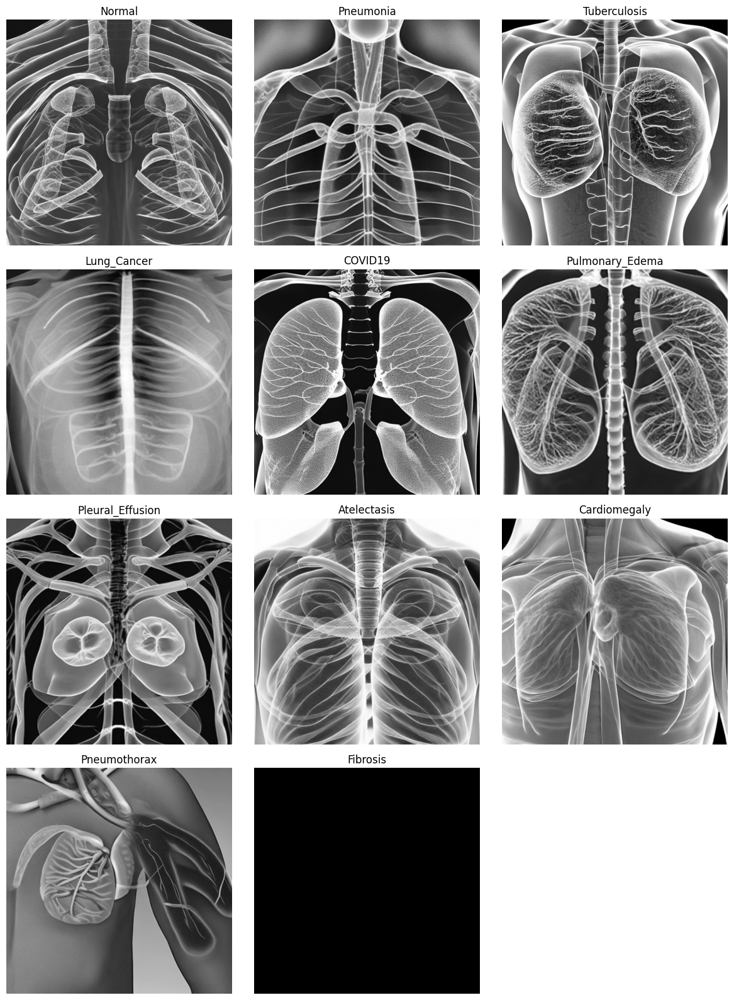

In [ ]:
import os
import math
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt

# -----------------------------------
# 1. Device Configuration
# -----------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# -----------------------------------
# 2. Load Diffusion Model
# -----------------------------------
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32
)
pipe = pipe.to(device)
pipe.enable_attention_slicing()

# -----------------------------------
# 3. X-ray Prompts (ALL Labels)
# -----------------------------------
xray_prompts = {
    "Normal": "Chest X-ray image of a healthy human lung, normal radiograph, medical imaging, grayscale",
    "Pneumonia": "Chest X-ray showing lung opacity and consolidation consistent with pneumonia, grayscale radiology image",
    "Tuberculosis": "Chest X-ray showing lung cavities and lesions consistent with tuberculosis, grayscale radiology scan",
    "Lung_Cancer": "Chest X-ray showing a visible lung mass consistent with lung cancer, grayscale medical imaging",
    "COVID19": "Chest X-ray showing bilateral ground-glass opacities consistent with COVID-19 infection, grayscale",
    "Pulmonary_Edema": "Chest X-ray showing bilateral lung haziness and fluid accumulation consistent with pulmonary edema",
    "Pleural_Effusion": "Chest X-ray showing fluid accumulation at lung bases consistent with pleural effusion",
    "Atelectasis": "Chest X-ray showing partial lung collapse consistent with atelectasis",
    "Cardiomegaly": "Chest X-ray showing enlarged cardiac silhouette consistent with cardiomegaly",
    "Pneumothorax": "Chest X-ray showing collapsed lung and pleural line consistent with pneumothorax",
    "Fibrosis": "Chest X-ray showing reticular lung scarring consistent with pulmonary fibrosis"
}

# -----------------------------------
# 4. Dataset Directory
# -----------------------------------
dataset_root = "synthetic_xray_dataset"
os.makedirs(dataset_root, exist_ok=True)

# -----------------------------------
# 5. Generate & Save Images
# -----------------------------------
samples_to_display = []

for label, prompt in xray_prompts.items():
    label_dir = os.path.join(dataset_root, label)
    os.makedirs(label_dir, exist_ok=True)

    image = pipe(
        prompt,
        num_inference_steps=25,
        guidance_scale=7.5
    ).images[0]

    image = image.convert("L")  # grayscale

    image_path = os.path.join(label_dir, f"{label}_01.png")
    image.save(image_path)

    samples_to_display.append((label, image))
    print(f"Saved: {image_path}")

# -----------------------------------
# 6. Display ALL Images (AUTO GRID FIX)
# -----------------------------------
num_images = len(samples_to_display)
cols = 3
rows = math.ceil(num_images / cols)

plt.figure(figsize=(cols * 4, rows * 4))

for i, (label, img) in enumerate(samples_to_display):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap="gray")
    plt.title(label)
    plt.axis("off")

plt.tight_layout()
plt.show()


Using device: cuda


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_03.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_01.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_02.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_03.png


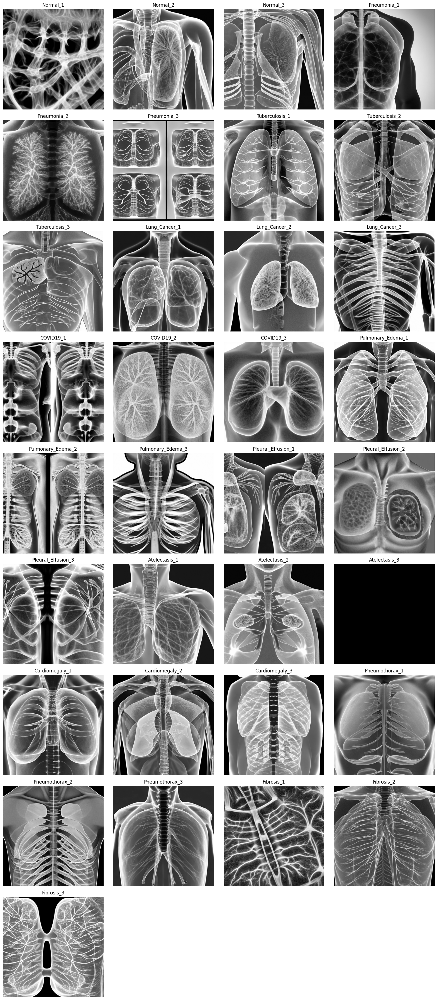

In [ ]:
import os
import math
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt

# -----------------------------------
# 1. Device Configuration
# -----------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# -----------------------------------
# 2. Load Diffusion Model
# -----------------------------------
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32
)
pipe = pipe.to(device)
pipe.enable_attention_slicing()

# -----------------------------------
# 3. X-ray Prompts (UNCHANGED)
# -----------------------------------
xray_prompts = {
    "Normal": "Chest X-ray image of a healthy human lung, normal radiograph, medical imaging, grayscale",
    "Pneumonia": "A high-resolution chest X-ray image (frontal view), grayscale medical imaging style, showing lung opacity and consolidation consistent with pneumonia, realistic radiology appearance, hospital diagnostic X-ray, no text, no labels",
    "Tuberculosis": "Chest X-ray of tuberculosis patient, lung lesions and cavities, medical imaging, grayscale",
    "Lung_Cancer": "Chest X-ray showing lung cancer, visible mass in lung region, radiology scan, grayscale",
    "COVID19": "A frontal chest X-ray image showing bilateral ground-glass opacities and patchy lung involvement consistent with COVID-19 infection, grayscale diagnostic X-ray, realistic hospital scan",
    "Pulmonary_Edema": "A chest X-ray showing bilateral lung haziness and fluid accumulation consistent with pulmonary edema, grayscale radiology image, realistic hospital diagnostic scan",
    "Pleural_Effusion": "A frontal chest X-ray showing fluid accumulation at lung bases consistent with pleural effusion, grayscale medical imaging, realistic diagnostic quality",
    "Atelectasis": "A chest X-ray frontal view showing partial lung collapse and reduced lung volume consistent with atelectasis, grayscale radiology image, realistic clinical appearance",
    "Cardiomegaly": "A frontal chest X-ray image showing enlarged cardiac silhouette consistent with cardiomegaly, grayscale diagnostic imaging, realistic hospital X-ray scan",
    "Pneumothorax": "A chest X-ray frontal view showing collapsed lung with visible pleural line consistent with pneumothorax, grayscale medical imaging, high clinical accuracy",
    "Fibrosis": "A chest X-ray image showing reticular lung patterns and scarring consistent with pulmonary fibrosis, grayscale diagnostic radiology scan, realistic hospital imaging",
}

# -----------------------------------
# 4. Dataset Directory
# -----------------------------------
dataset_root = "synthetic_xray_dataset"
os.makedirs(dataset_root, exist_ok=True)

# -----------------------------------
# 5. Generate & Save 3 Images per Category
# -----------------------------------
IMAGES_PER_CLASS = 3
samples_to_display = []

for label, prompt in xray_prompts.items():
    label_dir = os.path.join(dataset_root, label)
    os.makedirs(label_dir, exist_ok=True)

    for i in range(IMAGES_PER_CLASS):
        image = pipe(
            prompt,
            num_inference_steps=25,
            guidance_scale=7.5
        ).images[0]

        image = image.convert("L")  # grayscale

        image_path = os.path.join(label_dir, f"{label}_{i+1:02d}.png")
        image.save(image_path)

        samples_to_display.append((f"{label}_{i+1}", image))
        print(f"Saved: {image_path}")

# -----------------------------------
# 6. Display ALL Images (AUTO GRID)
# -----------------------------------
num_images = len(samples_to_display)
cols = 4
rows = math.ceil(num_images / cols)

plt.figure(figsize=(cols * 4, rows * 4))

for i, (label, img) in enumerate(samples_to_display):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap="gray")
    plt.title(label)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# =========================================================
# DenseNet Training on Synthetic X-ray Dataset (Single File)
# =========================================================

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split

# ---------------------------------------------------------
# 1. Device Configuration
# ---------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ---------------------------------------------------------
# 2. Dataset Path
# ---------------------------------------------------------
DATASET_DIR = "synthetic_xray_dataset"

# ---------------------------------------------------------
# 3. Image Transformations
# DenseNet expects 3-channel (RGB) images
# ---------------------------------------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ---------------------------------------------------------
# 4. Load Dataset
# Folder-per-class structure
# ---------------------------------------------------------
dataset = datasets.ImageFolder(root=DATASET_DIR, transform=transform)

class_names = dataset.classes
num_classes = len(class_names)

print("Classes:", class_names)
print("Number of classes:", num_classes)
print("Total images:", len(dataset))

# ---------------------------------------------------------
# 5. Train / Validation Split (80 / 20)
# ---------------------------------------------------------
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(
    dataset, [train_size, val_size]
)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# ---------------------------------------------------------
# 6. Load DenseNet-121 (Pretrained)
# ---------------------------------------------------------
model = models.densenet121(pretrained=True)

# Replace classifier for multi-class classification
model.classifier = nn.Linear(
    model.classifier.in_features,
    num_classes
)

model = model.to(device)

# ---------------------------------------------------------
# 7. Freeze Backbone (IMPORTANT for small datasets)
# ---------------------------------------------------------
for param in model.features.parameters():
    param.requires_grad = False

# ---------------------------------------------------------
# 8. Loss Function & Optimizer
# ---------------------------------------------------------
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.classifier.parameters(),
    lr=0.001
)

# ---------------------------------------------------------
# 9. Training Loop
# ---------------------------------------------------------
EPOCHS = 15

for epoch in range(EPOCHS):
    # ---- Training ----
    model.train()
    train_loss = 0.0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # ---- Validation ----
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_accuracy = 100 * correct / total if total > 0 else 0

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Loss: {train_loss / len(train_loader):.4f} | "
        f"Val Loss: {val_loss / len(val_loader):.4f} | "

    )

# ---------------------------------------------------------
# 10. Save Trained Model
# ---------------------------------------------------------
MODEL_PATH = "densenet_synthetic_xray.pth"
torch.save(model.state_dict(), MODEL_PATH)

print("Training complete.")
print("Model saved at:", MODEL_PATH)


Using device: cuda
Classes: ['Atelectasis', 'COVID19', 'Cardiomegaly', 'Fibrosis', 'Lung_Cancer', 'Normal', 'Pleural Effusion', 'Pleural_Effusion', 'Pneumonia', 'Pneumothorax', 'Pulmonary Edema', 'Pulmonary_Edema', 'Tuberculosis']
Number of classes: 13
Total images: 35
Epoch [1/15] | Train Loss: 2.8716 | Val Loss: 3.1136 | 
Epoch [2/15] | Train Loss: 2.4457 | Val Loss: 3.1894 | 
Epoch [3/15] | Train Loss: 2.2903 | Val Loss: 3.0857 | 
Epoch [4/15] | Train Loss: 2.1545 | Val Loss: 3.1603 | 
Epoch [5/15] | Train Loss: 2.1058 | Val Loss: 3.3010 | 
Epoch [6/15] | Train Loss: 1.9434 | Val Loss: 3.2869 | 
Epoch [7/15] | Train Loss: 1.7558 | Val Loss: 3.3650 | 
Epoch [8/15] | Train Loss: 1.6972 | Val Loss: 3.3910 | 
Epoch [9/15] | Train Loss: 1.5151 | Val Loss: 3.4514 | 
Epoch [10/15] | Train Loss: 1.6547 | Val Loss: 3.2881 | 
Epoch [11/15] | Train Loss: 1.3616 | Val Loss: 3.3606 | 
Epoch [12/15] | Train Loss: 1.4841 | Val Loss: 3.3768 | 
Epoch [13/15] | Train Loss: 1.3125 | Val Loss: 3.2262 |

In [ ]:
import os
import torch
from diffusers import AutoPipelineForText2Image
from PIL import Image

# -------------------------------------------------
# 1. Device Configuration
# -------------------------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# -------------------------------------------------
# 2. Load FAST Stable Diffusion Turbo
# -------------------------------------------------
model_id = "stabilityai/sd-turbo"

pipe = AutoPipelineForText2Image.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32
)
pipe = pipe.to(device)

# -------------------------------------------------
# 3. X-ray Prompts (UNCHANGED)
# -------------------------------------------------
xray_prompts = {
    "Normal": "Chest X-ray image of a healthy human lung, grayscale medical imaging",
    "Pneumonia": "Chest X-ray showing lung opacity and consolidation consistent with pneumonia",
    "Tuberculosis": "Chest X-ray showing lung cavities and lesions consistent with tuberculosis",
    "Lung_Cancer": "Chest X-ray showing visible lung mass consistent with lung cancer",
    "COVID19": "Chest X-ray showing bilateral ground-glass opacities consistent with COVID-19",
    "Pulmonary_Edema": "Chest X-ray showing bilateral lung haziness and fluid accumulation",
    "Pleural_Effusion": "Chest X-ray showing fluid accumulation at lung bases",
    "Atelectasis": "Chest X-ray showing partial lung collapse",
    "Cardiomegaly": "Chest X-ray showing enlarged cardiac silhouette",
    "Pneumothorax": "Chest X-ray showing collapsed lung and pleural line",
    "Fibrosis": "Chest X-ray showing reticular lung scarring"
}

# -------------------------------------------------
# 4. Dataset Directory
# -------------------------------------------------
dataset_root = "synthetic_xray_dataset"
os.makedirs(dataset_root, exist_ok=True)

# -------------------------------------------------
# 5. Generate & Save Images (FAST)
# -------------------------------------------------
IMAGES_PER_CLASS = 20

for label, prompt in xray_prompts.items():
    label_dir = os.path.join(dataset_root, label)
    os.makedirs(label_dir, exist_ok=True)

    print(f"\nGenerating {IMAGES_PER_CLASS} images for {label}")

    for i in range(IMAGES_PER_CLASS):
        image = pipe(
            prompt=prompt,
            num_inference_steps=2,   # 🔥 Turbo magic
            guidance_scale=0.0
        ).images[0]

        image = image.convert("L")  # grayscale

        image_path = os.path.join(label_dir, f"{label}_{i+1:03d}.png")
        image.save(image_path)

        print(f"Saved: {image_path}")

print("\n✅ FAST dataset generation complete.")


Using device: cuda


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/618 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/655 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .



Generating 20 images for Normal


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Normal/Normal_020.png

Generating 20 images for Pneumonia


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumonia/Pneumonia_020.png

Generating 20 images for Tuberculosis


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Tuberculosis/Tuberculosis_020.png

Generating 20 images for Lung_Cancer


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Lung_Cancer/Lung_Cancer_020.png

Generating 20 images for COVID19


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/COVID19/COVID19_020.png

Generating 20 images for Pulmonary_Edema


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pulmonary_Edema/Pulmonary_Edema_020.png

Generating 20 images for Pleural_Effusion


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pleural_Effusion/Pleural_Effusion_020.png

Generating 20 images for Atelectasis


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Atelectasis/Atelectasis_020.png

Generating 20 images for Cardiomegaly


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Cardiomegaly/Cardiomegaly_020.png

Generating 20 images for Pneumothorax


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Pneumothorax/Pneumothorax_020.png

Generating 20 images for Fibrosis


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_001.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_002.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_003.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_004.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_005.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_006.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_007.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_008.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_009.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_010.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_011.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_012.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_013.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_014.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_015.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_016.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_017.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_018.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_019.png


  0%|          | 0/2 [00:00<?, ?it/s]

Saved: synthetic_xray_dataset/Fibrosis/Fibrosis_020.png

✅ FAST dataset generation complete.


In [ ]:
print("Dataset saved at:", os.path.abspath(dataset_root))


Dataset saved at: /content/synthetic_xray_dataset


In [ ]:
import shutil

shutil.make_archive(
    "synthetic_xray_dataset",
    "zip",
    dataset_root
)

print("Dataset zipped successfully.")


Dataset zipped successfully.


In [ ]:
# =====================================================
# Train DenseNet on Synthetic X-ray Dataset
# =====================================================

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split

# -----------------------------------------------------
# 1. Device
# -----------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# -----------------------------------------------------
# 2. Dataset Path
# -----------------------------------------------------
DATASET_DIR = "synthetic_xray_dataset"

# -----------------------------------------------------
# 3. Image Transforms
# (DenseNet expects 3-channel images)
# -----------------------------------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# -----------------------------------------------------
# 4. Load Dataset
# -----------------------------------------------------
dataset = datasets.ImageFolder(root=DATASET_DIR, transform=transform)

class_names = dataset.classes
num_classes = len(class_names)

print("Classes:", class_names)
print("Number of classes:", num_classes)
print("Total images:", len(dataset))

# -----------------------------------------------------
# 5. Train / Validation Split
# -----------------------------------------------------
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# -----------------------------------------------------
# 6. Load DenseNet-121
# -----------------------------------------------------
model = models.densenet121(pretrained=True)

model.classifier = nn.Linear(
    model.classifier.in_features,
    num_classes
)

model = model.to(device)

# -----------------------------------------------------
# 7. Freeze Backbone (important for small datasets)
# -----------------------------------------------------
for param in model.features.parameters():
    param.requires_grad = False

# -----------------------------------------------------
# 8. Loss & Optimizer
# -----------------------------------------------------
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.classifier.parameters(),
    lr=0.001
)

# -----------------------------------------------------
# 9. Training Loop
# -----------------------------------------------------
EPOCHS = 15

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, preds = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()

    val_acc = 100 * correct / total if total > 0 else 0

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Loss: {train_loss/len(train_loader):.4f} | "
        f"Val Loss: {val_loss/len(val_loader):.4f} | "
        f"Val Acc: {val_acc:.2f}%"
    )

# -----------------------------------------------------
# 10. Save Model
# -----------------------------------------------------
torch.save(model.state_dict(), "densenet_synthetic_xray.pth")
print("Model saved as densenet_synthetic_xray.pth")


Using device: cuda
Classes: ['Atelectasis', 'COVID19', 'Cardiomegaly', 'Fibrosis', 'Lung_Cancer', 'Normal', 'Pleural Effusion', 'Pleural_Effusion', 'Pneumonia', 'Pneumothorax', 'Pulmonary Edema', 'Pulmonary_Edema', 'Tuberculosis']
Number of classes: 13
Total images: 255
Epoch [1/15] | Train Loss: 2.6359 | Val Loss: 2.6251 | Val Acc: 9.80%
Epoch [2/15] | Train Loss: 2.3119 | Val Loss: 2.4947 | Val Acc: 15.69%
Epoch [3/15] | Train Loss: 2.1797 | Val Loss: 2.2437 | Val Acc: 15.69%
Epoch [4/15] | Train Loss: 2.1759 | Val Loss: 2.2663 | Val Acc: 21.57%
Epoch [5/15] | Train Loss: 1.9599 | Val Loss: 2.2928 | Val Acc: 23.53%
Epoch [6/15] | Train Loss: 1.8548 | Val Loss: 2.1453 | Val Acc: 25.49%
Epoch [7/15] | Train Loss: 1.8244 | Val Loss: 2.1611 | Val Acc: 17.65%
Epoch [8/15] | Train Loss: 1.7560 | Val Loss: 2.1706 | Val Acc: 21.57%
Epoch [9/15] | Train Loss: 1.6778 | Val Loss: 2.0953 | Val Acc: 27.45%
Epoch [10/15] | Train Loss: 1.6558 | Val Loss: 2.1529 | Val Acc: 25.49%
Epoch [11/15] | Tra

In [ ]:
pip install torch torchvision matplotlib


In [ ]:
# ================= FULL DENSENET TRAINING PIPELINE (ONE FLOW) =================

# ---- GPU CHECK ----
import torch
print("GPU Available:", torch.cuda.is_available())

# ---- INSTALL KAGGLE ----
!pip install -q kaggle

# ---- UPLOAD KAGGLE KEY ----
from google.colab import files
files.upload()   # upload kaggle.json

# ---- KAGGLE SETUP ----
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# ---- DOWNLOAD DATASET ----
!kaggle datasets download -d jtiptj/chest-xray-pneumoniacovid19tuberculosis
!unzip -q chest-xray-pneumoniacovid19tuberculosis.zip

# ---- IMPORT LIBRARIES ----
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader

# ---- PARAMETERS ----
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
LR = 0.0001

# ---- DATA TRANSFORMS ----
train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

test_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

# ---- LOAD DATA ----
train_ds = datasets.ImageFolder("chest_xray/train", transform=train_tf)
test_ds  = datasets.ImageFolder("chest_xray/test", transform=test_tf)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

num_classes = len(train_ds.classes)
print("Classes:", train_ds.classes)

# ---- MODEL ----
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.densenet121(pretrained=True)
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model = model.to(device)

# ---- LOSS & OPTIMIZER ----
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

# ---- TRAINING ----
for epoch in range(EPOCHS):
    model.train()
    correct, total, loss_sum = 0, 0, 0

    for x, y in train_loader:
        x, y = x.to(device), y.to(device)

        optimizer.zero_grad()
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()

        loss_sum += loss.item()
        _, pred = torch.max(out, 1)
        correct += (pred == y).sum().item()
        total += y.size(0)

    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {loss_sum:.4f} | Train Acc: {100*correct/total:.2f}%")

# ---- TEST ACCURACY ----
model.eval()
correct, total = 0, 0

with torch.no_grad():
    for x, y in test_loader:
        x, y = x.to(device), y.to(device)
        out = model(x)
        _, pred = torch.max(out, 1)
        correct += (pred == y).sum().item()
        total += y.size(0)

print(f"Test Accuracy: {100*correct/total:.2f}%")

# ---- SAVE MODEL ----
torch.save(model.state_dict(), "densenet_chest_xray.pth")
print("Model Saved")


GPU Available: True
